#THE BATTLE OF NEIGHBORHOODS

##**PROBLEM STATEMENT**-
### ONE OF THE CLIENT WANTS TO OPEN A NEW FRIENDS THEMED CAFE IN BENGALURU AND THE INVESTORS ARE LOOKING FOR A SUITABLE NEIGHBORHOOD TO SET UP THEIR CAFE AT.

##IMPLEMENTATION
### THUS BY CLUSTERING THE NEIGHBORHOODS BY USING KMEANS ALGORITHM , WE CLUSTER REGIONS OF BANGALORE THEREBY FINDING THE SUITABLE NEIGHBORHOOD WITH THE HELP OF GOOGLE API AND LOCATION VENUES FROM FOURSQUARE .
 

### Importing Libraries

In [0]:
import requests
import lxml.html as lh
import pandas as pd
import numpy as np
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')

/bin/bash: conda: command not found
Libraries imported.


###WEB SCRAPING MAPS OF INDIA WEBSITE TO OBTAIN THE PINCODE DATA IN BENGALURU BY USING REQUESTS.

In [0]:
url='https://www.mapsofindia.com/pincode/india/karnataka/bangalore/'

#Create a handle, page, to handle the contents of the website
page = requests.get(url)

#Store the contents of the website under doc
doc = lh.fromstring(page.content)

#Parse data that are stored between <tr>..</tr> of HTML
tr_elements = doc.xpath('//tr')

In [0]:
[len(T) for T in tr_elements[:12]]

[1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4]

In [0]:
tr_elements = doc.xpath('//tr')
#Create empty list
col=[]
i=0
#For each row, store each first element (header) and an empty list
for t in tr_elements[1]:
    i+=1
    name=t.text_content()
    print ('%d:"%s"'%(i,name))
    col.append((name,[]))

1:"Location"
2:"Pincode "
3:"State "
4:"District "


In [0]:
#Since out first row is the header, data is stored on the second row onwards
for j in range(2,len(tr_elements)):
    #T is our j'th row
    T=tr_elements[j]
    
    #If row is not of size 10, the //tr data is not from our table 
    if len(T)!=4:
        break
    
    #i is the index of our column
    i=0
    
    #Iterate through each element of the row
    for t in T.iterchildren():
        data=t.text_content() 
        #Check if row is empty
        if i>0:
        #Convert any numerical value to integers
            try:
                data=int(data)
            except:
                pass
        #Append the data to the empty list of the i'th column
        col[i][1].append(data)
        #Increment i for the next column
        i+=1

In [0]:
[len(C) for (title,C) in col]

[294, 294, 294, 294]

####CREATING A DATAFRAME OUT OF DATA WE OBTAINED.

In [0]:
Dict={title:column for (title,column) in col}
df=pd.DataFrame(Dict)

In [0]:
df.columns = ['Location', 'Pin_Code','State', 'District']
df = df[['Location', 'Pin_Code','State', 'District']]
df['District'] = df['District'].map(lambda x: x.rstrip('\n'))

In [0]:
df = df[~df.Location.str.contains("Not assigned")]

In [0]:
#df = df.groupby(['Pin_Code', 'District'], as_index=False, sort=False).agg(','. join)
df.head()
df.to_csv('dataframe.csv', sep = ' ')

In [0]:
df['Pin_Code'].count()

294

AS WE NEED ADDRESS LATITUDE AND LOCATION OF THE AVAILABLE PINCODES , WE USE GEOPY LIBRARY'S NOMINATIM METHOD. 
TO EXTRACT ALL LOCATION DATA AT ONCE, WE NEED TO HAVE SUBSCRIPTION TO GOOGLE API.
I HAVE REQUESTED 50 LOCATION DATA EACH TIME AN LATER MERGED ON TO ONE LIST.

In [0]:
from  geopy.geocoders import Nominatim
from geopy.exc import GeocoderTimedOut
import time
geolocator = Nominatim()
ll5=[]

for pincode in df['Pin_Code'][264:295]:
  #print(address)
  loc = geolocator.geocode(pincode)
  
  
  ll5.append(loc)
  #print("latitude is :-" ,loc.latitude,"\nlongtitude is:-" ,loc.longitude)

/usr/local/lib/python3.6/dist-packages/geopy/geocoders/osm.py:143: UserWarning: Using Nominatim with the default "geopy/1.17.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  UserWarning


In [0]:
#ll50
#ll100
len(ll5)
#latlong200last

30

In [0]:
onefinallist = ll50+ll100+ll1+ll2+ll3+ll5 #+latlong200last
len(onefinallist)

281

In [0]:
onefinallist

[Location(HBR Layout, Bangalore Urban, Karnataka, 560063, India, (13.024835033572, 77.6242587170682, 0.0)),
 Location(Lakkasandra, Bangalore Urban, Karnataka, 560030, India, (12.9412961913929, 77.6023313528567, 0.0)),
 None,
 Location(Domlur Ward, Bangalore Urban, Karnataka, 560007, India, (12.9686203, 77.6310733, 0.0)),
 Location(Domlur Ward, Bangalore Urban, Karnataka, 560007, India, (12.9686203, 77.6310733, 0.0)),
 Location(Byatarayanapura, Bangalore Urban, Karnataka, 560092, India, (13.0502398051013, 77.6014177058184, 0.0)),
 Location(Hebbala Ward, Bangalore Urban, Karnataka, 560024, India, (13.0350856876908, 77.5975456598515, 0.0)),
 Location(Bangalore Urban, Karnataka, 562106, India, (12.7749265869139, 77.6893131311581, 0.0)),
 Location(Bangalore Urban, Karnataka, 562106, India, (12.7749265869139, 77.6893131311581, 0.0)),
 Location(Thanisandra, Bangalore Urban, Karnataka, 560045, India, (13.0421527347054, 77.6215590219012, 0.0)),
 Location(Gandhinagar, West Zone, Bengaluru, Banga

In [0]:
# Remove all NONE VALUES and making a new list data
data =[]
none = []
for elem in range(len(onefinallist)):
  if onefinallist[elem] == None:
    none.append(onefinallist[elem])
  else:
    data.append(onefinallist[elem])

In [0]:
len(data)

265

BY PICKLING, HAVE EXPORTED OUR DATA (LIST) AS A TXT FILE SO AS TO DUMP THE LOCATION DATA EASILY AND NOT SENDING REQUEST EVERYTIME I RUN THE CODE FOR THE SAME DATA.


In [0]:
import pickle

with open("projectpinlatdata.txt", "wb") as fp:   #Pickling
  pickle.dump(data, fp)

In [0]:
latitude=[]
longitude=[]
address =[]
for location in range(len(data)):
  
  latitude.append(data[location].latitude)
  longitude.append(data[location].longitude)
  address.append(data[location].address)
print('end')


end


#new dataframe containing all required data.

In [0]:
dataframe50 = pd.DataFrame(latitude,columns = ['latitude'])

In [0]:
dataframe50['longitude'] = longitude
dataframe50['address'] = address


In [0]:
len(dataframe50)

265

#Dropping out the duplicate values if any

In [0]:
dataframe50.drop_duplicates(inplace=True)
len(dataframe50)
dataframe50.head()

,latitude,longitude,address
0,13.024835,77.624259,"HBR Layout, Bangalore Urban, Karnataka, 560063..."
1,12.941296,77.602331,"Lakkasandra, Bangalore Urban, Karnataka, 56003..."
2,12.968620,77.631073,"Domlur Ward, Bangalore Urban, Karnataka, 56000..."
4,13.050240,77.601418,"Byatarayanapura, Bangalore Urban, Karnataka, 5..."
5,13.035086,77.597546,"Hebbala Ward, Bangalore Urban, Karnataka, 5600..."


#Getting the lat and long of bangalore to create a map using folium

In [0]:
address = 'bangalore'

geolocator = Nominatim()
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Bangalore are {}, {}.'.format(latitude, longitude))

/usr/local/lib/python3.6/dist-packages/geopy/geocoders/osm.py:143: UserWarning: Using Nominatim with the default "geopy/1.17.0" `user_agent` is strongly discouraged, as it violates Nominatim's ToS https://operations.osmfoundation.org/policies/nominatim/ and may possibly cause 403 and 429 HTTP errors. Please specify a custom `user_agent` with `Nominatim(user_agent="my-application")` or by overriding the default `user_agent`: `geopy.geocoders.options.default_user_agent = "my-application"`. In geopy 2.0 this will become an exception.
  UserWarning


The geograpical coordinates of Bangalore are 12.9791198, 77.5912997.


# Create a map of Bangalore with neighborhoods superimposed on top


In [0]:
# create map of Bengaluru using latitude and longitude values
map_bangalore = folium.Map(location=[latitude, longitude], zoom_start=11)

# add markers to map
for lat, lng, label in zip(dataframe50['latitude'], dataframe50['longitude'], dataframe50['address']):
    #print(lat,lng,label)
    label = folium.Popup(label, parse_html=True)
    
    folium.vector_layers.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7
        ).add_to(map_bangalore)  
    
    
map_bangalore

### Using Foursquare API to explore the neighborhoods

In [0]:
CLIENT_ID = 'WKVMV42SGQNKL3FNYLT3QTVM3IRNX1AKPTFMX05Z4RSV1DD4' #Foursquare ID
CLIENT_SECRET = 'NENGWRTUTO1BPIG3DPRCIVIBN1NPEB42Y1UXYHKOF31TZFET' #Foursquare Secret
VERSION = '20180604' # Foursquare API version
LIMIT = 100

### Get the top 100 venues within a radius of 500 meters

In [0]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [0]:
bangalore_venues = getNearbyVenues(names=dataframe50['address'],
                                   latitudes=dataframe50['latitude'],
                                   longitudes=dataframe50['longitude']
                                  )

HBR Layout, Bangalore Urban, Karnataka, 560063, India
Lakkasandra, Bangalore Urban, Karnataka, 560030, India
Domlur Ward, Bangalore Urban, Karnataka, 560007, India
Byatarayanapura, Bangalore Urban, Karnataka, 560092, India
Hebbala Ward, Bangalore Urban, Karnataka, 560024, India
Bangalore Urban, Karnataka, 562106, India
Thanisandra, Bangalore Urban, Karnataka, 560045, India
Gandhinagar, West Zone, Bengaluru, Bangalore Urban, Karnataka, 560003, India
Girinagara, Bangalore Urban, Karnataka, 560050, India
Bangalore Urban, Karnataka, 562107, India
Yelahanka Satellite Town, Bangalore Urban, Karnataka, 560064, India
Vannarpete Ward, Bangalore Urban, Karnataka, 560047, India
Srinagar Ward, Bangalore Urban, Karnataka, 560026, India
Nagapura Ward, West Zone, Bengaluru, Bangalore Urban, Karnataka, 560086, India
Dharmaraya Swamy Temple Ward, South Zone, Bengaluru, Bangalore Urban, Karnataka, 560002, India
Ganesh Mandir ward, South Zone, Bengaluru, Bangalore Urban, Karnataka, 560070, India
Bagalaku

In [0]:
print(bangalore_venues.shape)
bangalore_venues.Venue.unique()

(1039, 7)


array(['Vasan Eye Care', 'New Krishna Sagar', 'Garam Masala',
       'snooker place', 'V&P Sound', 'Eikowa Art Pvt Ltd',
       'Bangalore One @ HBR BDA Complex', 'Fine Fair Departmentals',
       'Cafe Coffee Day', "Domino's Pizza", 'Zapak Gameplex',
       'Arrfa Bakery And Sweets', 'Mico grounds', 'Chai Point',
       'Lassi Point', 'Mast Kalandar', 'Madurai Idly Shop',
       'Lal Rakhra Agencies Sports World', 'Layali Restaurant',
       'Srinidhi Sagar', 'Reliance Fresh', 'Pankaj Medicals',
       'Heritage Fresh', 'CCD Express', 'kabab studio - coraltree',
       'Hindustan mess', 'CityPearl SuperMarket', 'BDA PARK',
       'City Pearl', 'United Colors of Benetton', 'Adyar Ananda Bhavan',
       'Kuttanadu Restaurant', 'The Orange', 'Barista Lavazza',
       'Lakshmi Juice Centre', 'Corner House', 'New Krishna Bhavan',
       'Umesh Dosa Point', 'Mad Over Donuts', 'Kalmane Koffees',
       "Swensen's", 'Chowmein', 'Krispy Kreme Doughnuts', 'Mantri Square',
       'Starbucks Coff

In [0]:
bangalore_venues.groupby('Venue Category').count()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude
Venue Category,,,,,,
ATM,1,1,1,1,1,1
Accessories Store,2,2,2,2,2,2
Airport,1,1,1,1,1,1
American Restaurant,7,7,7,7,7,7
Andhra Restaurant,4,4,4,4,4,4
Arcade,5,5,5,5,5,5
Art Gallery,2,2,2,2,2,2
Arts & Entertainment,1,1,1,1,1,1
Asian Restaurant,9,9,9,9,9,9


### Venues for each neighborhood

In [0]:
bangalore_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
"Adugodi, Bangalore Urban, Karnataka, 560095, India",77,77,77,77,77,77
"Agrahara Dasarahalli Ward, Bangalore Urban, Karnataka, 560079, India",36,36,36,36,36,36
"Aramane Nagara Ward, Bangalore Urban, Karnataka, 560012, India",1,1,1,1,1,1
"Aramane Nagara Ward, Bangalore Urban, Karnataka, 560080, India",16,16,16,16,16,16
"Aramane Nagara Ward, West Zone, Bengaluru, Bangalore Urban, Karnataka, 560094, India",14,14,14,14,14,14
"Attiguppe Ward, Bangalore Urban, Karnataka, 560072, India",17,17,17,17,17,17
"Bad Düben 1 / Vereinigte Mulde, B 2;B 107, Altenhof, Bad Düben, Nordsachsen, Sachsen, 04849, Deutschland",5,5,5,5,5,5
"Bagalakunte, Bangalore Urban, Karnataka, 560073, India",10,10,10,10,10,10
"Banasavadi, Bangalore Urban, Karnataka, 560043, India",92,92,92,92,92,92


In [0]:
# one hot encoding
bangalore_onehot = pd.get_dummies(bangalore_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
bangalore_onehot['Neighborhood'] = bangalore_venues['Neighborhood'] 

# move neighborhood column to the first column
col_list = list(bangalore_onehot.columns)
col_list.remove('Neighborhood')
cols = ['Neighborhood'] + [col for col in col_list]

bangalore_onehot = bangalore_onehot[cols]
bangalore_onehot

,Neighborhood,ATM,Accessories Store,Airport,American Restaurant,Andhra Restaurant,Arcade,Art Gallery,Arts & Entertainment,Asian Restaurant,Athletics & Sports,Auto Dealership,Auto Garage,Auto Workshop,BBQ Joint,Badminton Court,Bakery,Bar,Beach,Bed & Breakfast,Bengali Restaurant,Bistro,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Buffet,Burger Joint,Burrito Place,Bus Station,Café,Candy Store,Caribbean Restaurant,Chaat Place,Chinese Restaurant,Chocolate Shop,Clothing Store,Cocktail Bar,Coffee Shop,Concert Hall,Convenience Store,Cosmetics Shop,Creperie,Cuban Restaurant,Cupcake Shop,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Discount Store,Donut Shop,Electronics Store,Event Space,Farmers Market,Fast Food Restaurant,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Truck,Football Stadium,French Restaurant,Furniture / Home Store,Gaming Cafe,Gas Station,Gastropub,General Entertainment,German Restaurant,Golf Course,Gourmet Shop,Grocery Store,Gym,Gym / Fitness Center,Gym Pool,Historic Site,Hobby Shop,Hookah Bar,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Ice Cream Shop,Indian Chinese Restaurant,Indian Restaurant,Indian Sweet Shop,Indie Movie Theater,Insurance Office,Irish Pub,Italian Restaurant,Juice Bar,Karnataka Restaurant,Kerala Restaurant,Korean Restaurant,Lebanese Restaurant,Light Rail Station,Liquor Store,Lounge,Market,Massage Studio,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motorcycle Shop,Mountain,Movie Theater,Moving Target,Multiplex,Music Store,Music Venue,Nightclub,Optical Shop,Outlet Store,Paella Restaurant,Paintball Field,Paper / Office Supplies Store,Park,Pastry Shop,Performing Arts Venue,Pharmacy,Pizza Place,Playground,Plaza,Pool Hall,Print Shop,Pub,Rajasthani Restaurant,Restaurant,Road,Salad Place,Sandwich Place,Seafood Restaurant,Shop & Service,Shopping Mall,Smoke Shop,Snack Place,Soccer Field,Soccer Stadium,South Indian Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Supermarket,Sushi Restaurant,Syrian Restaurant,Tattoo Parlor,Tea Room,Tex-Mex Restaurant,Theater,Toy / Game Store,Trail,Train Station,Udupi Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant,Women's Store
0,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

In [0]:
bangalore_grouped = bangalore_onehot.groupby('Neighborhood').mean().reset_index()
bangalore_grouped.columns.values

array(['Neighborhood', 'ATM', 'Accessories Store', 'Airport',
       'American Restaurant', 'Andhra Restaurant', 'Arcade',
       'Art Gallery', 'Arts & Entertainment', 'Asian Restaurant',
       'Athletics & Sports', 'Auto Dealership', 'Auto Garage',
       'Auto Workshop', 'BBQ Joint', 'Badminton Court', 'Bakery', 'Bar',
       'Beach', 'Bed & Breakfast', 'Bengali Restaurant', 'Bistro',
       'Boat or Ferry', 'Bookstore', 'Boutique', 'Bowling Alley',
       'Breakfast Spot', 'Brewery', 'Buffet', 'Burger Joint',
       'Burrito Place', 'Bus Station', 'Café', 'Candy Store',
       'Caribbean Restaurant', 'Chaat Place', 'Chinese Restaurant',
       'Chocolate Shop', 'Clothing Store', 'Cocktail Bar', 'Coffee Shop',
       'Concert Hall', 'Convenience Store', 'Cosmetics Shop', 'Creperie',
       'Cuban Restaurant', 'Cupcake Shop', 'Deli / Bodega',
       'Department Store', 'Design Studio', 'Dessert Shop', 'Diner',
       'Discount Store', 'Donut Shop', 'Electronics Store', 'Event Space'

In [0]:
len(bangalore_grouped[bangalore_grouped[["Café"]] > 0])

84

In [0]:
bangalore_ft = bangalore_grouped[["Neighborhood", "Café"]]

In [0]:
bangalore_ft.head(100)

,Neighborhood,Café
0,"Adugodi, Bangalore Urban, Karnataka, 560095, I...",0.077922
1,"Agrahara Dasarahalli Ward, Bangalore Urban, Ka...",0.083333
2,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.000000
3,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.125000
4,"Aramane Nagara Ward, West Zone, Bengaluru, Ban...",0.142857
5,"Attiguppe Ward, Bangalore Urban, Karnataka, 56...",0.058824
6,"Bad Düben 1 / Vereinigte Mulde, B 2;B 107, Alt...",0.000000
7,"Bagalakunte, Bangalore Urban, Karnataka, 56007...",0.000000
8,"Banasavadi, Bangalore Urban, Karnataka, 560043...",0.130435
9,"Bangalore Urban, Karnataka, 562107, India",0.000000


#Elbow method for selecting the value of K in k means clustering

In [0]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(bangalore_ft.drop(["Neighborhood"], 1))
    Sum_of_squared_distances.append(km.inertia_)

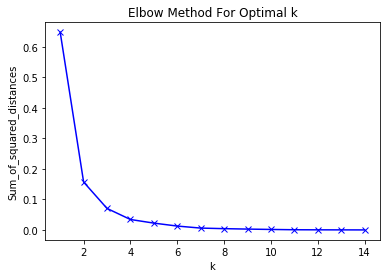

In [0]:
import matplotlib.pyplot as plt
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

## Clustering Neighborhoods

In [0]:
# set number of clusters
kclusters = 3

bangalore_clustering = bangalore_ft.drop(["Neighborhood"], 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bangalore_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:12]

array([2, 2, 0, 2, 2, 2, 0, 0, 2, 0, 0, 0], dtype=int32)

In [0]:
bangalore_merged = bangalore_ft.copy()

# add clustering labels
bangalore_merged["Cluster Labels"] = kmeans.labels_

In [0]:
bangalore_merged.head()

,Neighborhood,Café,Cluster Labels
0,"Adugodi, Bangalore Urban, Karnataka, 560095, I...",0.077922,2
1,"Agrahara Dasarahalli Ward, Bangalore Urban, Ka...",0.083333,2
2,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.000000,0
3,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.125000,2
4,"Aramane Nagara Ward, West Zone, Bengaluru, Ban...",0.142857,2


In [0]:
bangalore_merged = bangalore_merged.join(dataframe50.set_index("address"), on="Neighborhood")

print(bangalore_merged.shape)
bangalore_merged.head() # check the last columns!

(84, 5)


,Neighborhood,Café,Cluster Labels,latitude,longitude
0,"Adugodi, Bangalore Urban, Karnataka, 560095, I...",0.077922,2,12.937408,77.617194
1,"Agrahara Dasarahalli Ward, Bangalore Urban, Ka...",0.083333,2,12.986317,77.538645
2,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.000000,0,13.016303,77.567539
3,"Aramane Nagara Ward, Bangalore Urban, Karnatak...",0.125000,2,13.009380,77.578950
4,"Aramane Nagara Ward, West Zone, Bengaluru, Ban...",0.142857,2,13.025605,77.577489


In [0]:
bangalore_merged.sort_values(["Cluster Labels"], inplace=True)
bangalore_merged

,Neighborhood,Café,Cluster Labels,latitude,longitude
41,"Hosa Tippasandra, Bangalore Urban, Karnataka, ...",0.000000,0,12.971605,77.660248
28,"Garudachara Palya, Mahadevapura Zone, Bengalur...",0.000000,0,12.992503,77.690460
59,"Nagapura Ward, West Zone, Bengaluru, Bangalore...",0.000000,0,13.002355,77.544116
30,"Girinagara, Bangalore Urban, Karnataka, 560085...",0.000000,0,12.932285,77.544870
31,"Gottigere Ward, Bangalore Urban, Karnataka, 56...",0.000000,0,12.875965,77.570989
32,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0.000000,0,13.024835,77.624259
69,"Sudhama Nagara, South Zone, Bengaluru, Bangalo...",0.000000,0,12.958330,77.586338
34,"Hagadur, Bangalore Urban, Karnataka, 560066, I...",0.000000,0,12.972400,77.735345
35,"Hampi Nagar Ward, Bangalore Urban, Karnataka, ...",0.000000,0,12.963996,77.540465
36,"Hebbala Ward, Bangalore Urban, Karnataka, 5600...",0.000000,0,13.035086,77.597546


In [0]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i+x+(i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(bangalore_merged['latitude'], bangalore_merged['longitude'], bangalore_merged['Neighborhood'], bangalore_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' - Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

In [0]:
map_clusters.save('map_clusters.html')

#CLUSTER 1 (RED COLOR MARKER)

In [0]:
cluster0 = bangalore_merged.loc[bangalore_merged['Cluster Labels'] == 0]
print(cluster0.count())
cluster0.head()

Neighborhood      49
Café              49
Cluster Labels    49
latitude          49
longitude         49
dtype: int64


,Neighborhood,Café,Cluster Labels,latitude,longitude
41,"Hosa Tippasandra, Bangalore Urban, Karnataka, ...",0.0,0,12.971605,77.660248
28,"Garudachara Palya, Mahadevapura Zone, Bengalur...",0.0,0,12.992503,77.690460
59,"Nagapura Ward, West Zone, Bengaluru, Bangalore...",0.0,0,13.002355,77.544116
30,"Girinagara, Bangalore Urban, Karnataka, 560085...",0.0,0,12.932285,77.544870
31,"Gottigere Ward, Bangalore Urban, Karnataka, 56...",0.0,0,12.875965,77.570989


#CLUSTER 2 (Purple COLOR MARKER)

In [0]:
cluster1 = bangalore_merged.loc[bangalore_merged['Cluster Labels'] == 1]
print(cluster1.count())
cluster1.head()

Neighborhood      15
Café              15
Cluster Labels    15
latitude          15
longitude         15
dtype: int64


,Neighborhood,Café,Cluster Labels,latitude,longitude
57,"Maruthi Seva Nagar, East Zone, Bengaluru, Bang...",0.2500,1,13.007577,77.623185
62,"Rajaji Nagar Ward, Bangalore Urban, Karnataka,...",0.2000,1,12.991882,77.553189
63,"Rajaji Nagar Ward, West Zone, Bengaluru, Banga...",0.2000,1,12.993448,77.554879
64,"Rajaji Nagar Ward, West Zone, Bengaluru, Banga...",0.2500,1,12.993840,77.555621
33,"HSR Layout Ward, Bommanahalli Zone, Bengaluru,...",0.1875,1,12.917377,77.651274


#CLUSTER 2 (GREEN COLOR MARKER)

In [0]:
cluster2 = bangalore_merged.loc[bangalore_merged['Cluster Labels'] == 2]
print(cluster2.count())
cluster2.head()

Neighborhood      20
Café              20
Cluster Labels    20
latitude          20
longitude         20
dtype: int64


,Neighborhood,Café,Cluster Labels,latitude,longitude
75,"Vasanth Nagar, Bangalore Urban, Karnataka, 560...",0.054054,2,12.989434,77.595643
77,"Vasanthpura Ward, Bangalore Urban, Karnataka, ...",0.076923,2,12.910704,77.548512
80,"Yediyur Ward, South Zone, Bengaluru, Bangalore...",0.058824,2,12.938951,77.573982
68,"Shantala Nagar, Bangalore Urban, Karnataka, 56...",0.086420,2,12.968677,77.607481
0,"Adugodi, Bangalore Urban, Karnataka, 560095, I...",0.077922,2,12.937408,77.617194


In [0]:
#final merged df
bangalore_merged

,Neighborhood,Café,Cluster Labels,latitude,longitude
41,"Hosa Tippasandra, Bangalore Urban, Karnataka, ...",0.000000,0,12.971605,77.660248
28,"Garudachara Palya, Mahadevapura Zone, Bengalur...",0.000000,0,12.992503,77.690460
59,"Nagapura Ward, West Zone, Bengaluru, Bangalore...",0.000000,0,13.002355,77.544116
30,"Girinagara, Bangalore Urban, Karnataka, 560085...",0.000000,0,12.932285,77.544870
31,"Gottigere Ward, Bangalore Urban, Karnataka, 56...",0.000000,0,12.875965,77.570989
32,"HBR Layout, Bangalore Urban, Karnataka, 560063...",0.000000,0,13.024835,77.624259
69,"Sudhama Nagara, South Zone, Bengaluru, Bangalo...",0.000000,0,12.958330,77.586338
34,"Hagadur, Bangalore Urban, Karnataka, 560066, I...",0.000000,0,12.972400,77.735345
35,"Hampi Nagar Ward, Bangalore Urban, Karnataka, ...",0.000000,0,12.963996,77.540465
36,"Hebbala Ward, Bangalore Urban, Karnataka, 5600...",0.000000,0,13.035086,77.597546


In [0]:
##THE END 